<a href="https://colab.research.google.com/github/meetnaren/Goodreads-book-analysis/blob/master/Goodreads_Data_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploring Goodreads data
This notebook explores the data collected from Goodreads on a large number of books. We will look at the various attributes to frame a problem statement at the end to work on.

## 1. Setting up the environment
Importing all the required packages. A couple of notes:
- langdetect: helps detect language in any unicode string. We can use this to detect the language of the book
- cufflinks: cufflinks makes plotting with Pandas and Plotly a lot easier. More here: https://plot.ly/ipython-notebooks/cufflinks/

In [21]:
!pip install langdetect -q
from langdetect import detect

import string
valid_chars=string.ascii_letters+string.digits+' '

import pandas as pd
import numpy as np

import cufflinks as cf
cf.go_offline()
from collections import defaultdict

from google.colab import files

def configure_plotly_browser_state():
    #This function is required to see Plotly charts in colab. Call this function in every cell where a Plotly chart gets drawn.
    import IPython
    display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-1.43.1.min.js?noext',
            },
          });
        </script>
        '''))

## 2. Kaggle setup
All the data collected from Goodreads are hosted on Kaggle. The two cells below make use of the Kaggle API to download the data and unzip to be used for our analysis. Please make sure you have your 'kaggle.json' file available to be uploaded upon execution of the cell below.

In [2]:
!pip install kaggle --upgrade -q
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"meetnaren","key":"6700344b6f629d95287ff74ec425a11f"}'}

In [3]:
!mkdir ~/.kaggle
!mv kaggle.json ~/.kaggle/kaggle.json
!mkdir train
!mkdir test

!kaggle datasets download -d meetnaren/goodreads-best-books -p train
!kaggle datasets download -d meetnaren/goodreads-best-books-of-2018 -p test

!unzip train/goodreads-best-books.zip -d train
!unzip test/goodreads-best-books-of-2018.zip -d test

book_data_train=pd.read_csv('train/book_data.csv')
book_data_test=pd.read_csv('test/book_data.csv')

100% 2.13G/2.13G [00:35<00:00, 21.7MB/s]
100% 2.13G/2.13G [00:35<00:00, 64.0MB/s]
 85% 59.0M/69.7M [00:00<00:00, 59.5MB/s]
100% 69.7M/69.7M [00:00<00:00, 87.2MB/s]
Archive:  train/goodreads-best-books.zip
  inflating: train/images.zip        
  inflating: train/book_data.csv     
Archive:  test/goodreads-best-books-of-2018.zip
  inflating: test/images.zip         
  inflating: test/book_data.csv      


In [4]:
book_data_train.head()

,book_authors,book_desc,book_edition,book_format,book_isbn,book_pages,book_rating,book_rating_count,book_review_count,book_title,genres,image_url
0,Suzanne Collins,Winning will make you famous. Losing means cer...,NaN,Hardcover,9.78044E+12,374 pages,4.33,5519135,160706,The Hunger Games,Young Adult|Fiction|Science Fiction|Dystopia|F...,https://images.gr-assets.com/books/1447303603l...
1,J.K. Rowling|Mary GrandPré,There is a door at the end of a silent corrido...,US Edition,Paperback,9.78044E+12,870 pages,4.48,2041594,33264,Harry Potter and the Order of the Phoenix,Fantasy|Young Adult|Fiction,https://images.gr-assets.com/books/1255614970l...
2,Harper Lee,The unforgettable novel of a childhood in a sl...,50th Anniversary,Paperback,9.78006E+12,324 pages,4.27,3745197,79450,To Kill a Mockingbird,Classics|Fiction|Historical|Historical Fiction...,https://images.gr-assets.com/books/1361975680l...
3,Jane Austen|Anna Quindlen|Mrs. Oliphant|George...,«È cosa ormai risaputa che a uno scapolo in po...,"Modern Library Classics, USA / CAN",Paperback,9.78068E+12,279 pages,4.25,2453620,54322,Pride and Prejudice,Classics|Fiction|Romance,https://images.gr-assets.com/books/1320399351l...
4,Stephenie Meyer,About three things I was absolutely positive.F...,NaN,Paperback,9.78032E+12,498 pages,3.58,4281268,97991,Twilight,Young Adult|Fantasy|Romance|Paranormal|Vampire...,https://images.gr-assets.com/books/1361039443l...


## 3. Exploring genres
Let us explore the genres of the books. The genres on the goodreads website are tagged by the users, so it helps to keep in mind that the data may not be completely accurate.

There are multiple genres that a book can belong to, e.g., a detective novel can belong to fiction, mystery, thriller, etc. Let's see how to plot the number of genres as a histogram to see the distribution.

In [119]:
configure_plotly_browser_state()

def genre_count(genres):
    '''
    Returns the number of genres in the genre column of the dataframe
    Input: genre data
    Output: no. of genres
    '''
    try:
        return len(genres.split('|'))
    except:
        return 0


book_data_train['num_genres'] = book_data_train['genres'].apply(genre_count)
book_data_train['num_genres'].iplot(kind='histogram', xTitle='No. of genres', yTitle='Count', gridcolor='rgba(0,0,0,0)')

On average, we could see that books are tagged with around 5-6 genres. Let us now see how many unique genres are available and the counts.

In [25]:
genre_counts=defaultdict(int)
for i in book_data_train.index:
    g=book_data_train.at[i, 'genres']
    if type(g)==str:
        for j in g.split('|'):
            genre_counts[j]+=1

print(len(genre_counts))

866


There's a whopping 866 unique genres in the data collected! While it may not be worth looking at each and every genre, let's take a look at the top genres.

In [118]:
configure_plotly_browser_state()
genre_counts_df=pd.DataFrame.from_records(sorted(genre_counts.items(), key=lambda x:x[1], reverse=True), columns=['genre', 'count'])
genre_counts_df[:50].iplot(
    kind='bar', 
    x='genre', 
    y='count',
    margin={
        'b':175
    },
    gridcolor='rgba(0,0,0,0)'
)

There seems to be quite a long tail of genres even in the top 50 list. Interestingly, the number of nonfiction books is quite low (~7.5K) compared to fiction (~26K).

## 4. Exploring book covers
Let us take a look at some of the book covers that we have collected to see if there are any discernible patterns mapping them to their respective genres.

In [0]:
!unzip -qq train/images.zip -d train

In [0]:
import matplotlib.pyplot as plt
from PIL import Image
from os.path import exists

def plot_book_covers(n):
    '''
    Prints a specified no. of book covers and their corresponding genres. Helps to examine if there is any pattern in the book covers
    Input: no. of book covers to display
    Output: None
    '''
    indices=list(np.random.randint(min(book_data_train.index), max(book_data_train.index), size=n))
    fig=plt.figure(figsize=(n*5, 10))
    for i in indices:
        if exists(f'train/images/{i}.jpg'):
            ax = fig.add_subplot(2, n, (indices.index(i)+1), xticks=[], yticks=[])
            ax.imshow(Image.open(f'train/images/{i}.jpg'))
            ax = fig.add_subplot(2, n, (indices.index(i)+1)+n, xticks=[], yticks=[])
            if type(book_data_train.at[i, 'genres'])==str:
                t='\n'.join(book_data_train.at[i, 'genres'].split('|'))
            else:
                t=''
            ax.text(0.5, 0.5, t, fontsize=15, horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

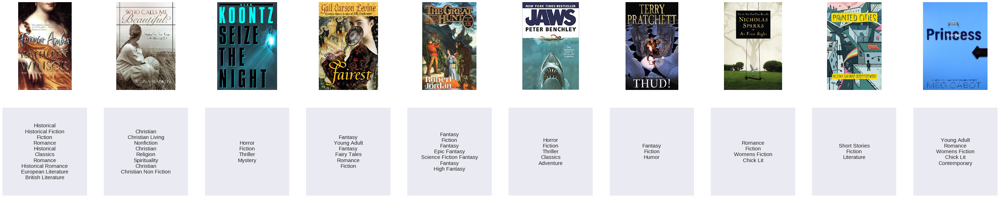

In [93]:
plot_book_covers(10)

From a first glance, I am not able to see any specific patterns in general between the book covers and the corresponding genres. Some of them seem to have random photos that don't have anything to do with the book title or genres. Let us explore other attributes of the dataset.

## 5. Exploring authors
Some of the books seem to have multiple authors. Similar to genres, let us take a look at the number of authors for each book.

In [117]:
book_data_train['num_authors']=book_data_train['book_authors'].str.split('|').apply(len)
configure_plotly_browser_state()
book_data_train['num_authors'].iplot(kind='histogram', xTitle='No. of authors', yTitle='Count', gridcolor='rgba(0,0,0,0)')

Wow! While a majority of the books seem to have just one author, we do seem to have some that have more than 10 authors (even 50, in some cases). Let us take a look at these books to make sure the data is not invalid.

In [96]:
book_data_train[book_data_train['num_authors']>10].head()

,book_authors,book_desc,book_edition,book_format,book_isbn,book_pages,book_rating,book_rating_count,book_review_count,book_title,genres,image_url,num_genres,num_authors
513,P.D. Eastman|Merwin Goldsmith|MARIAN HAILEY|Ro...,ARE YOU MY MOTHER? tells a very simple story f...,NaN,Paperback,9.78E+12,64 pages,4.17,192438,2129,Are You My Mother?,Childrens|Childrens|Picture Books,https://images.gr-assets.com/books/1389098758l...,3,11
2078,Neil Gaiman|Mike Dringenberg|Chris Bachalo|Mic...,One of the most popular and critically acclaim...,NaN,Slipcased Hardcover,9.7814E+12,612 pages,4.65,14832,512,"The Absolute Sandman, Volume One",Sequential Art|Graphic Novels|Sequential Art|C...,https://images.gr-assets.com/books/1312226853l...,6,15
3207,Plato|Benjamin Jowett|John M. Cooper|Dorothea ...,Outstanding translations by leading contempora...,NaN,Hardcover,9.78087E+12,1808 pages,4.34,9035,127,Complete Works,Philosophy|Classics|Nonfiction,https://images.gr-assets.com/books/1415678006l...,3,35
3322,Neil Gaiman|Marc Hempel|Richard Case|D'Israeli...,The Penultimate volume to the phenomenal Sandm...,NaN,Hardcover,9.78156E+12,352 pages,4.59,38524,1035,The Kindly Ones,Sequential Art|Graphic Novels|Sequential Art|C...,https://images.gr-assets.com/books/1339922887l...,7,11
3475,Neil Gaiman|Jill Thompson|Vince Locke|Bryan Ta...,One of the most popular and critically acclaim...,NaN,Slipcased Hardcover,9.7814E+12,616 pages,4.70,6146,128,"The Absolute Sandman, Volume Three",Sequential Art|Comics|Sequential Art|Graphic N...,https://images.gr-assets.com/books/1308879310l...,6,21


Upon researching these books, it seems that most of them are either illustrated books for children or collections of short stories. In the case of illustrated books, there are multiple illustrators, each of whom is listed as an author. And in the case of collections of short stories, the author of each short story is also listed as the author.

## 6. Exploring languages
One of the first things I noticed in the dataset was that there are books of various languages available in the list. If we need to run an experiment on the text of the book's description, we will need to make sure that they are all from the same language.

Let us look at the various languages available in the dataset.

In [0]:
def remove_invalid(df):
    '''
    Removes records that have invalid descriptions from the dataframe
    Input: dataframe
    Output: Cleaned up dataframe
    '''
    invalid_desc_idxs=[]
    for i in df.index:
        try:
            a=detect(df.at[i,'book_desc'])
        except:
            invalid_desc_idxs.append(i)
    
    df=df.drop(index=invalid_desc_idxs)
    return df

book_data_train=remove_invalid(book_data_train)
book_data_train['lang']=book_data_train.book_desc.apply(detect)

#Downloading the list of languages to map the two-letter lang code to the language name
lang_lookup=pd.read_html('https://en.wikipedia.org/wiki/List_of_ISO_639-1_codes')[1]
lang_lookup.drop(columns=[0], inplace=True)
lang_lookup.columns=lang_lookup.iloc[0]
lang_lookup=lang_lookup.reindex(lang_lookup.index.drop(0))
lang_lookup.rename(columns={'639-1': 'lang'}, inplace=True)

def get_language(lang):
    if lang in list(lang_lookup['lang']):
        return lang_lookup[lang_lookup['lang']==lang]['ISO language name'].values[0]
    else:
        return 'N/A'

book_data_train['language']=book_data_train['lang'].apply(get_language)

In [116]:
configure_plotly_browser_state()
group_by_lang=book_data_train.groupby(['language'])['book_title'].count().reset_index().sort_values(by=['book_title'], ascending=False)
group_by_lang.iplot(
    kind='bar', 
    x='language', 
    y='book_title',
    margin={
        'b':200
    },
    gridcolor='rgba(0,0,0,0)'
)

It's really interesting to see such a diverse set of languages in the list of top books of all time. English constitutes almost 90% of the books, though. Let us remove English from the chart to see the distribution better.

In [120]:
configure_plotly_browser_state()
group_by_lang[group_by_lang['language']!='English'].iplot(
    kind='bar', 
    x='language', 
    y='book_title',
    margin={
        'b':210
    },
    gridcolor='rgba(0,0,0,0)'
)

Out of curiosity, let me take a look at the books in Tamil (which is my mother tongue).

In [122]:
book_data_train[book_data_train['language']=='Tamil']

,book_authors,book_desc,book_edition,book_format,book_isbn,book_pages,book_rating,book_rating_count,book_review_count,book_title,genres,image_url,num_genres,num_authors,lang,language
16811,Aadhavan|ஆதவன்,"ஒரு நகர்ப்புற, மத்தியதர இளைஞன், ராமசேஷன் கண்கள...",NaN,NaN,NaN,200 pages,4.30,120,10,என் பெயர் ராமசேஷன் (En Peyar Ramaseshan),NaN,https://images.gr-assets.com/books/1200458644l...,0,2,ta,Tamil
17259,S. Ramakrishnan,தமிழின் நவீன இலக்கிய எழுத்தாளர்களில் குறிப்பிட...,NaN,Paperback,NaN,348 pages,4.20,424,22,துணையெழுத்து [Thunai Ezhuthu],Nonfiction,https://images.gr-assets.com/books/1340788772l...,1,1,ta,Tamil
17841,S. Balamurugan,தன்​​னை மனித உரி​மைச் ​செயல்பாமடுகளுடன் இ​ணைத்...,NaN,Paperback,NaN,240 pages,4.41,37,8,சோளகர் தொட்டி,Fiction|Literature,https://images.gr-assets.com/books/1341393391l...,2,1,ta,Tamil
20487,S. Ramakrishnan,கிணற்றுத் தவளையாக வாழும் மனிதர்கள் தானுண்டு தன...,Thirteenth Edition,Paperback,NaN,272 pages,4.02,307,18,தேசாந்திரி [Desanthiri],Travel,https://images.gr-assets.com/books/1340788675l...,1,1,ta,Tamil
23025,Era. Natarasan,கல்வி - வாழ்க்கை - அறிவியல் புனைக்கதைதமிழில் ஒ...,NaN,Mass Market Paperback,NaN,30 pages,4.38,93,13,ஆயிஷா [Ayeesha],Fiction,https://images.gr-assets.com/books/1410600544l...,1,1,ta,Tamil
35475,Kalki,கதையின் மற்றொரு நாயகனாகிய அருள்மொழிவர்மன் போர்...,NaN,NaN,NaN,200 pages,4.66,1371,52,பொன்னியின் செல்வன் - சுழற்காற்று (#2) [Ponniy...,Historical|Historical Fiction|Fiction|Classics,https://images.gr-assets.com/books/1349291735l...,4,1,ta,Tamil
37097,Kalki,வந்தியத்தேவனின் பயணங்கள் பல திடுக்கிடும் திருப...,NaN,Hardcover,NaN,180 pages,4.70,1148,32,பொன்னியின் செல்வன் - கொலை வாள் (#3) [Ponniyin ...,Historical|Historical Fiction|Asian Literature...,https://images.gr-assets.com/books/1349291280l...,6,1,ta,Tamil


Ponniyin Selvan, often regarded the greatest novel ever written in Tamil literature, features on this list! Glad to know :)

## 7. Next steps
I initially wanted to do an analysis of book covers to examine if the genres can be deduced from the pictures. But there are two issues:
1. The book covers dont seem to convery a lot of information about the genres of the books themselves
2. The genres seem to be very high in number and non-standard

I think deducing the genre of the book from its description seems to be a better problem statement. Although it's a trivial task, building a RNN model around it can definitely be helpful in learning how to structure data to be fed into a neural network. It will also need a bit of data cleaning as we saw above.